# MERFISH (Vizgen)

## Data download

Download the data from here: https://info.vizgen.com/mouse-liver-data

Which data is provided? Which data is needed for the first analysis?


## Data loading

In [1]:
import scanpy as sc
import squidpy as sq
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from pathlib import Path

In [2]:
vizgen_dir = Path().resolve() / "spatial" / "Vizgen_Test"
adata = sq.read.vizgen(
    path=vizgen_dir,
    counts_file="Liver1Slice1_cell_by_gene.csv",
    meta_file="Liver1Slice1_cell_metadata.csv",
    transformation_file="Liver1Slice1_images_micron_to_mosaic_pixel_transform.csv",
    library_id="Vizgen_Liver"
)

## QC

In [3]:
adata

AnnData object with n_obs × n_vars = 395215 × 385
    obs: 'fov', 'volume', 'min_x', 'max_x', 'min_y', 'max_y'
    uns: 'spatial'
    obsm: 'spatial'

In [4]:
adata.var_names_make_unique()
sc.pp.calculate_qc_metrics(adata,percent_top=None, inplace=True)

/home/uv525372/.local/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Axes: xlabel='n_genes_by_counts'>

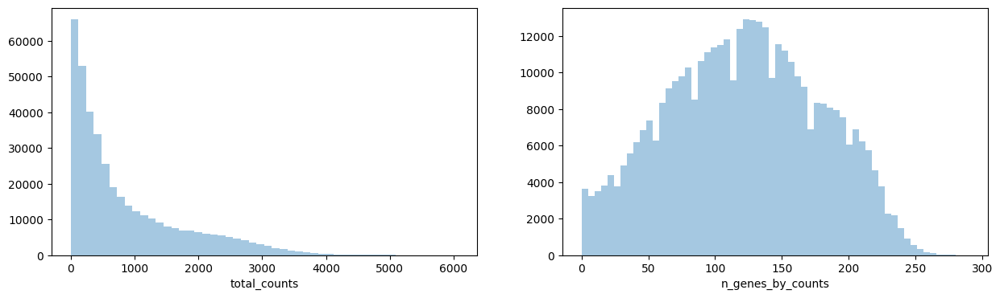

In [7]:
fig, axs = plt.subplots(1, 2, figsize=(15, 4))
sns.distplot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)
sns.distplot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    bins=60,
    ax=axs[1],
)

## Data processing

In [8]:
sc.pp.filter_genes(adata, min_counts=10)
sc.pp.filter_cells(adata,min_counts=10)

In [9]:
# Store the raw data
adata.raw = adata

In [10]:
# Normalization data
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

## Data analysis

In [11]:
sc.tl.pca(adata, svd_solver='arpack')

In [12]:
sc.pp.neighbors(adata,n_neighbors=25,use_rep='X_pca',random_state=0)

2023-09-11 08:50:55.558613: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-11 08:50:55.600433: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-11 08:50:55.601315: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-11 08:50:56.843216: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [13]:
sc.tl.leiden(adata, resolution=0.8)

In [14]:
sc.tl.umap(adata)

/home/uv525372/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


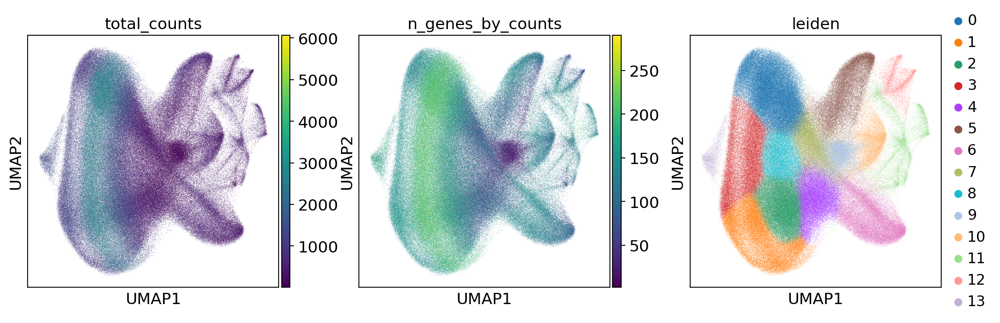

In [15]:
sc.set_figure_params(figsize=(4, 4))
sc.pl.umap(
    adata,
    color=[
        "total_counts",
        "n_genes_by_counts",
        "leiden",
    ],
    wspace=0.2,
)

/home/uv525372/.local/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


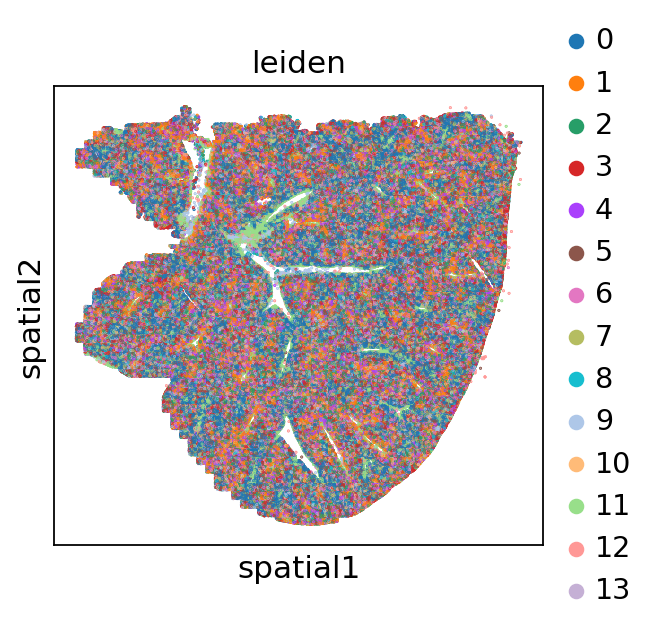

In [16]:
sq.pl.spatial_scatter(adata, shape=None,color=[
        "leiden",
    ],
    wspace=0.4,)

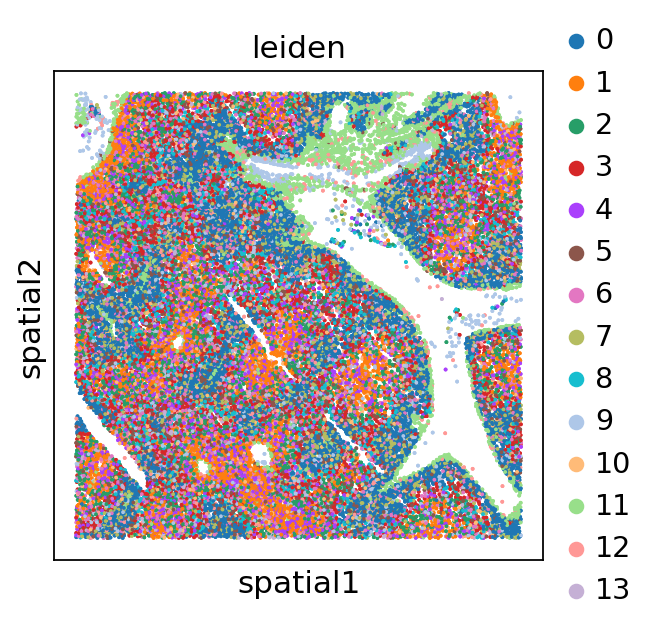

In [17]:
sq.pl.spatial_scatter(
    adata,
    color="leiden",
    shape=None,
    size=2,
    img=False,
    crop_coord=[(2500, 2500, 5000, 5000)])

In [26]:
adata.obs["leiden"].value_counts()

leiden
0     71988
1     41112
2     40827
3     34924
4     32989
5     32929
6     32102
7     22465
8     20374
9     18176
10    15969
11    13327
12     7869
13     3890
Name: count, dtype: int64

## Marker gene expression

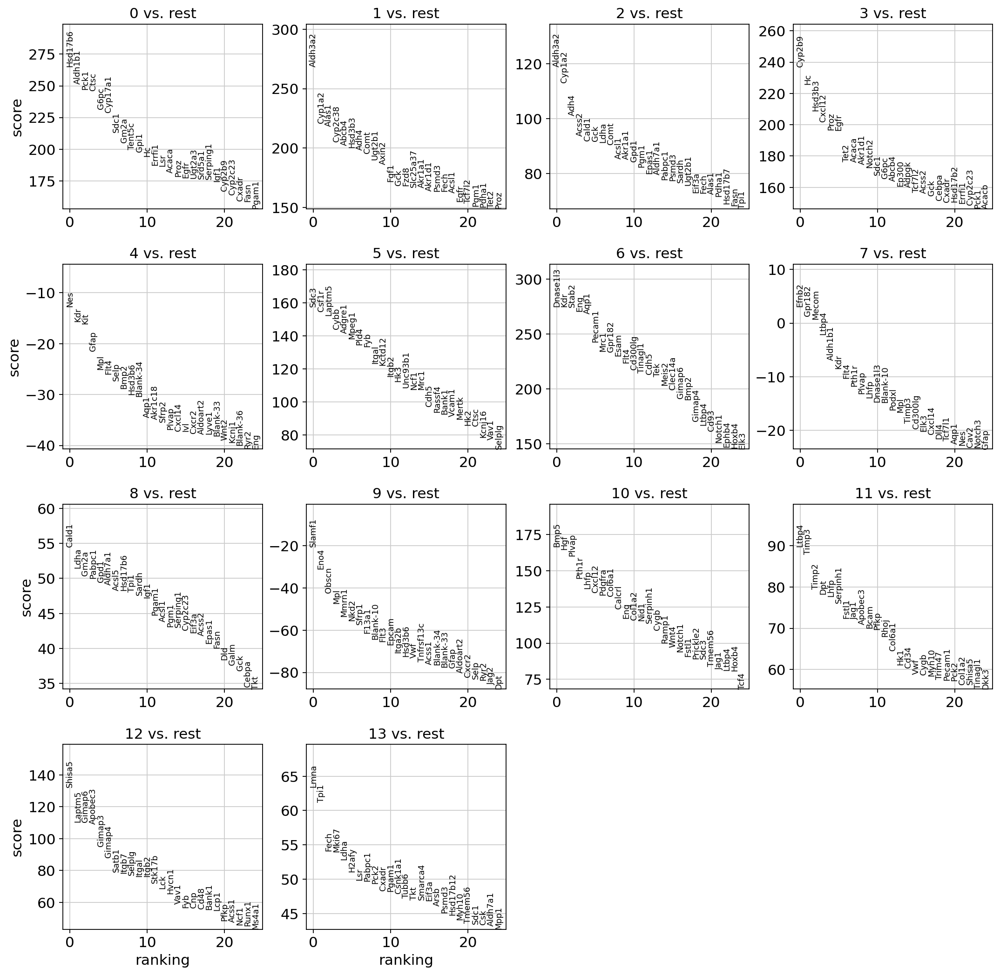

In [18]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)


In [20]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(5)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,Hsd17b6,Aldh3a2,Aldh3a2,Cyp2b9,Nes,Sdc3,Dnase1l3,Efnb2,Cald1,Slamf1,Bmp5,Ltbp4,Shisa5,Lmna
1,Aldh1b1,Cyp1a2,Cyp1a2,Hc,Kdr,Csf1r,Kdr,Gpr182,Ldha,Eno4,Hgf,Timp3,Laptm5,Tpi1
2,Pck1,Alas1,Adh4,Hsd3b3,Kit,Laptm5,Stab2,Mecom,Gm2a,Obscn,Plvap,Timp2,Gimap6,Fech
3,Ctsc,Cyp2c38,Acss2,Cxcl12,Gfap,Cybb,Eng,Ltbp4,Pabpc1,Mpl,Pth1r,Dpt,Apobec3,Mki67
4,G6pc,Abcb4,Cald1,Proz,Mpl,Adgre1,Aqp1,Aldh1b1,Gpd1,Mmrn1,Lhfp,Lhfp,Gimap3,Ldha


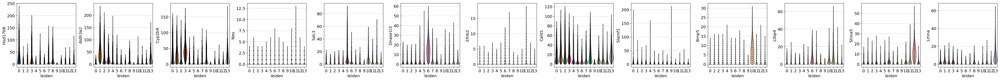

In [21]:
marker = adata.uns['rank_genes_groups']['names'][0]
sc.pl.violin(adata, marker, groupby='leiden')

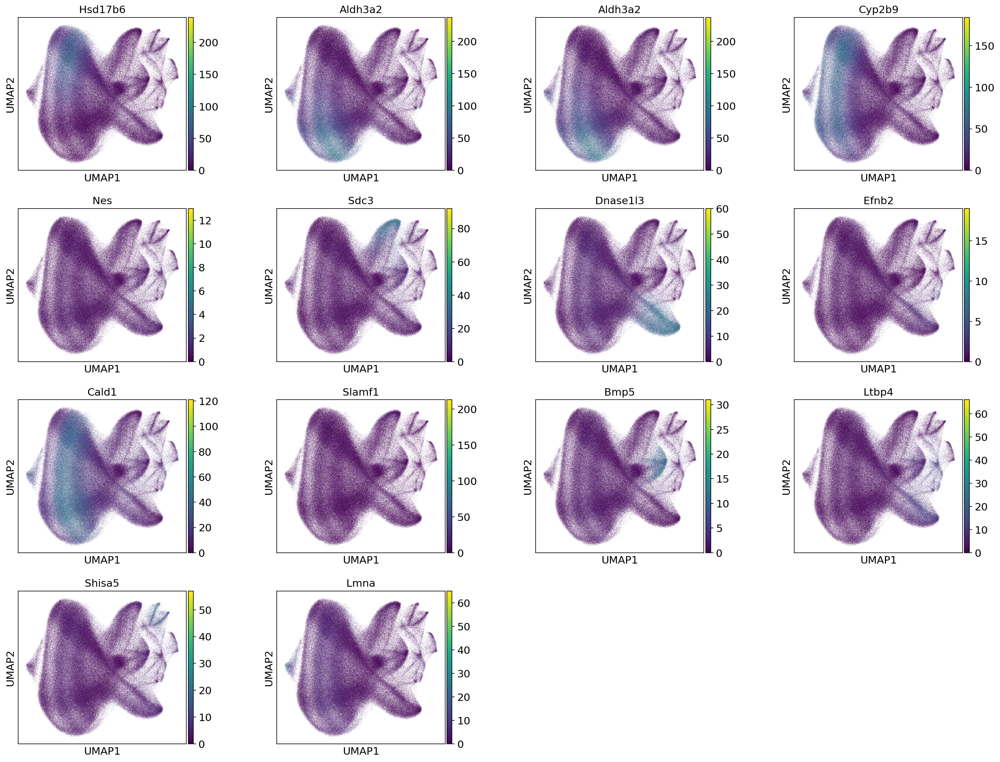

In [22]:
sc.pl.umap(
    adata,
    color=marker,
    wspace=0.4,
)

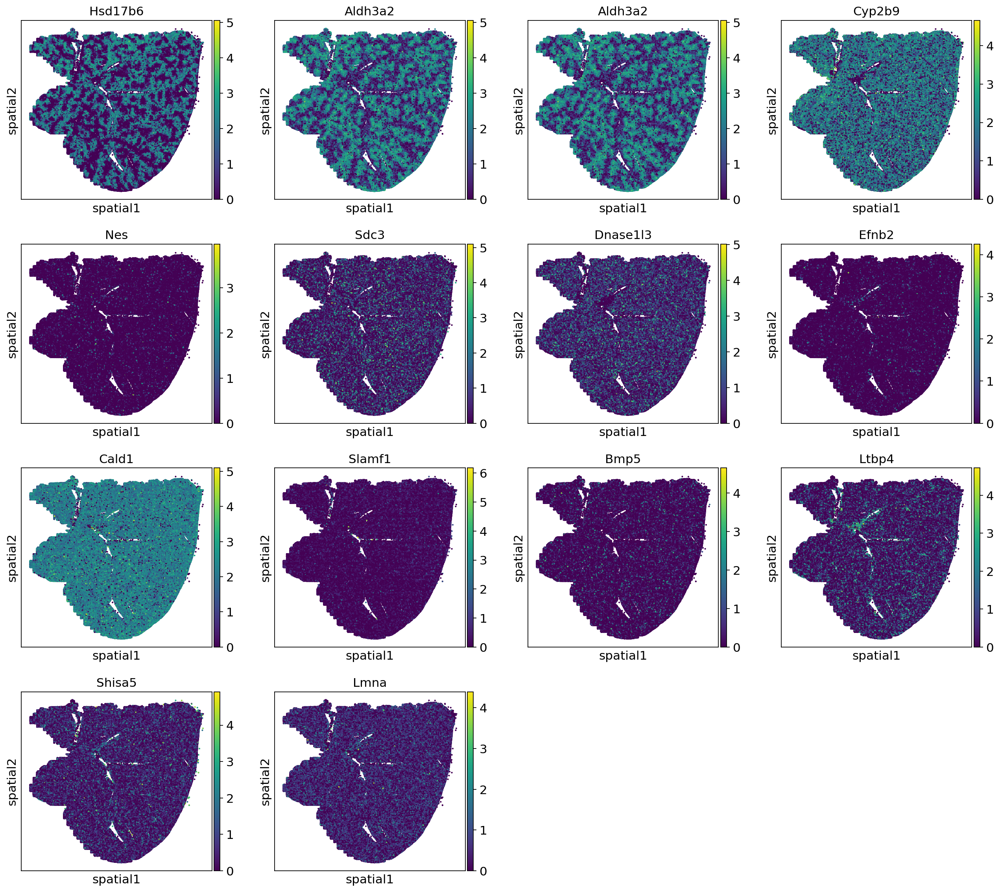

In [27]:
sq.pl.spatial_scatter(
    adata,
    color=marker,
    shape=None,
    size=2,
    use_raw=False,
    img=False,
)

/home/uv525372/.local/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


/home/uv525372/.local/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


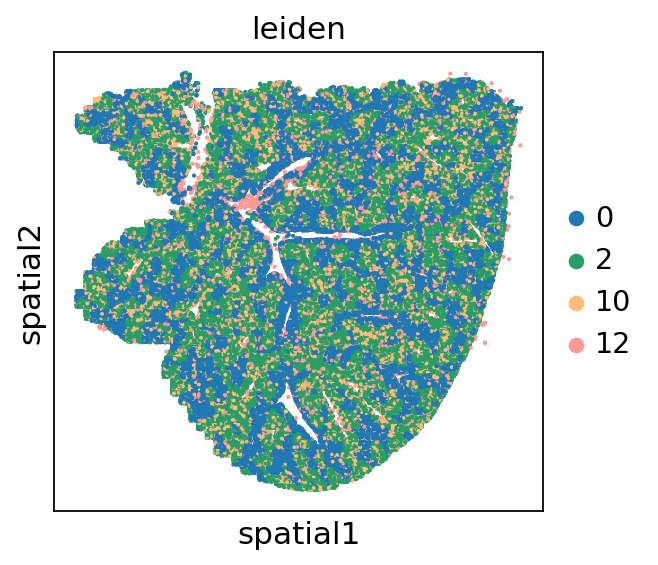

In [24]:
subset = adata[adata.obs["leiden"].isin(["0","2", "10", "12"])]
sq.pl.spatial_scatter(
    subset,
    color="leiden",
    shape=None,
    size=2,
    img=False,
)

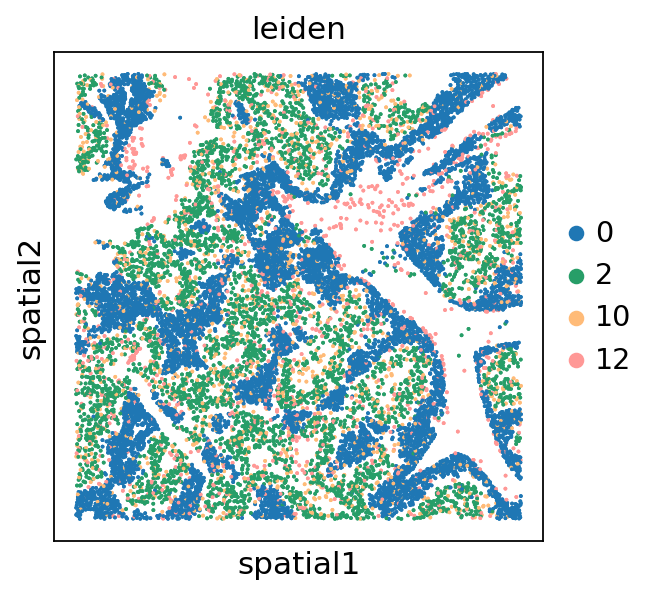

In [25]:
sq.pl.spatial_scatter(
    subset,
    color="leiden",
    shape=None,
    size=2,
    img=False,
    crop_coord=[(2000, 2000, 5000, 5000)])

In [ ]:
adata_spatial_neighbor = sq.gr.spatial_neighbors(
    adata, coord_type="generic", delaunay=True
)

In [29]:
sq.gr.centrality_scores(adata, cluster_key="leiden")

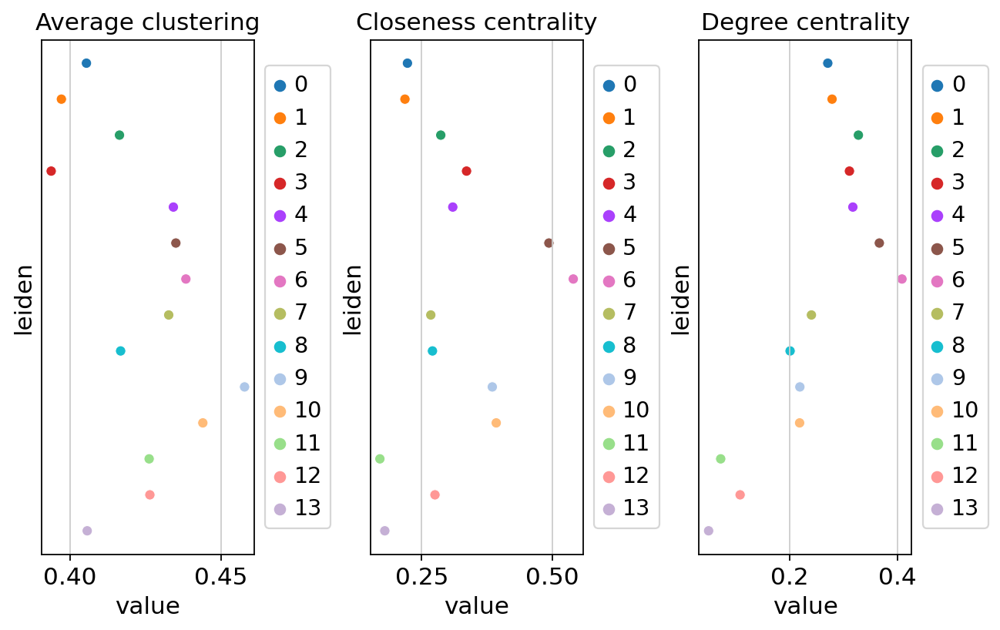

In [30]:
sq.pl.centrality_scores(adata, cluster_key="leiden", figsize=(8, 5))